/Users/arthurtestard/ntnu_code/machine_learning/ml_competition/models_arthur/signal_analysis.py:126: RuntimeWarning: invalid value encountered in divide
  y_filtred_fit = { loc: { h: (pred_from_model_data[loc][h] - np.mean(pred_from_model_data[loc][h])) / np.std(pred_from_model_data[loc][h]) for h in hours } for loc in locations }


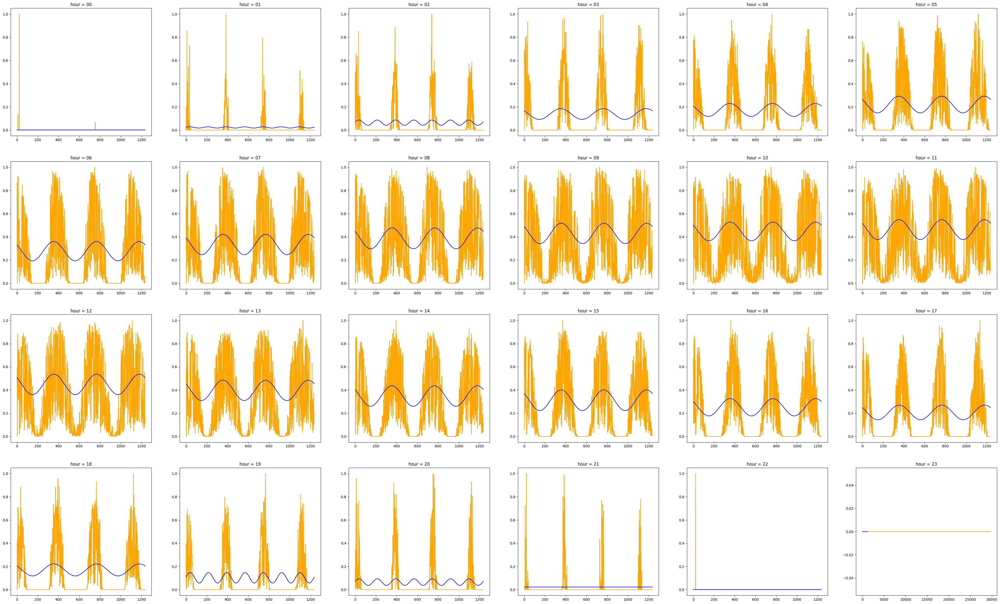

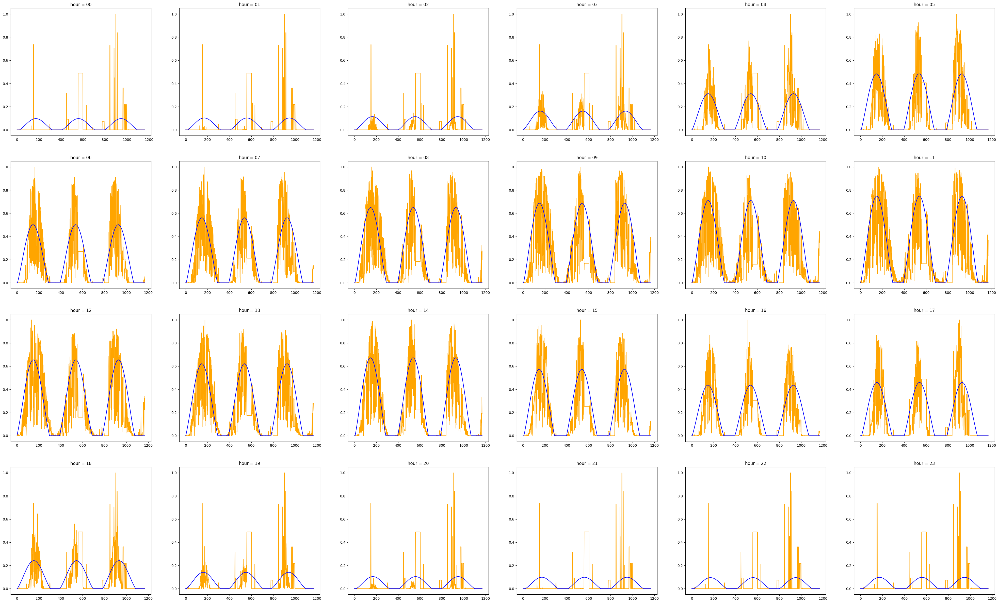

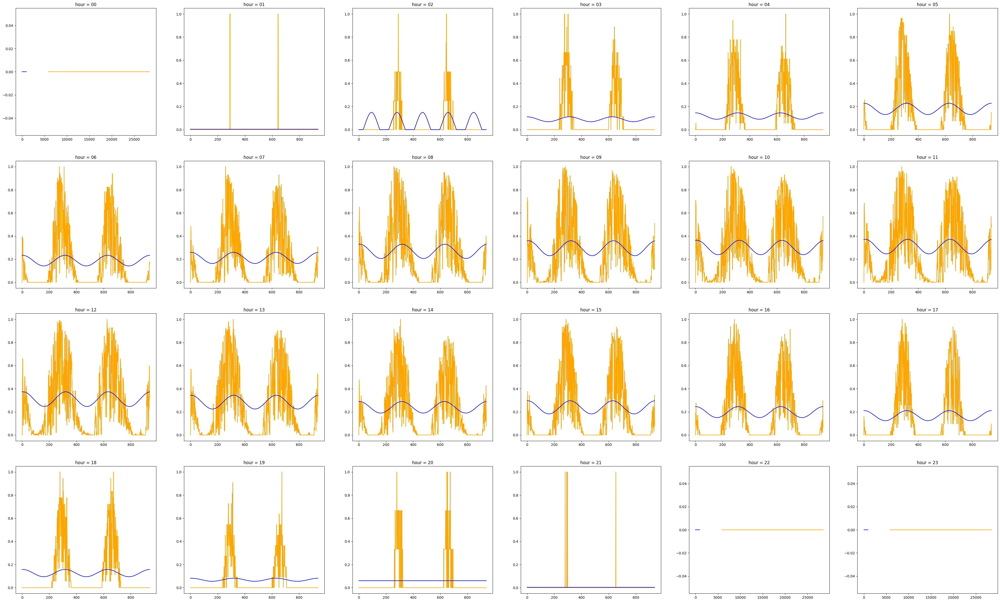

In [21]:
import matplotlib.pylab as plt
import signal_analysis as sa

from datetime import datetime, timedelta

start_date = { 
    'a': datetime(2020,10,21), 
    'b': datetime(2020, 3, 15), 
    'c': datetime(2020, 4, 1) 
}

start_date2 = { 
    'a': datetime(2019, 6, 2), 
    'b': datetime(2018, 12, 31), 
    'c': datetime(2019, 9, 4) 
}

end_date = { 
    'a': datetime(2022, 10, 21), 
    'b': datetime(2022, 3, 15), 
    'c': datetime(2022, 4, 1)
}

params = {
    'nb_frequences': 2, 
    'nb_days_to_predict': 0,
    'factor_to_fit': 2,
    'start_date': start_date2,
    'end_date': end_date,
}


y_train, y_pred_train = sa.get_normalized_y_and_pred_separated_by_hours_and_location(**params)

locations = ['a', 'b', 'c']
hours = [ f"0{h}" if h < 10 else str(h) for h in range(24) ]

for loc in locations:
    plt.figure(figsize=(50, 30))
    sp_loc = 1
    for h in hours:
        plt.subplot(4, 6, sp_loc)
        plt.plot(y_train[loc][h], color='orange')
        plt.plot(y_pred_train[loc][h], color='b')
        plt.title(f"hour = {h}")
        sp_loc += 1

In [27]:
import numpy as np
means_pred = []
means_train = []
for loc in locations:
    for h in hours:
        # print('loc', loc, 'hour', h, np.mean(y_train[loc][h]), np.mean(y_pred_train[loc][h]))
        means_pred.append(np.mean(y_pred_train[loc][h]))
        means_train.append(np.mean(y_train[loc][h]))

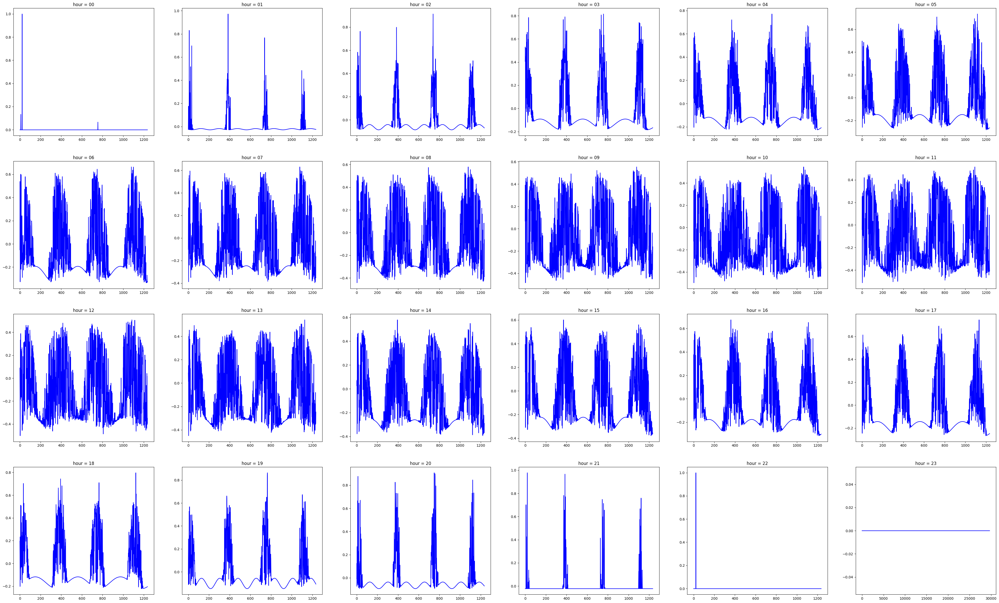

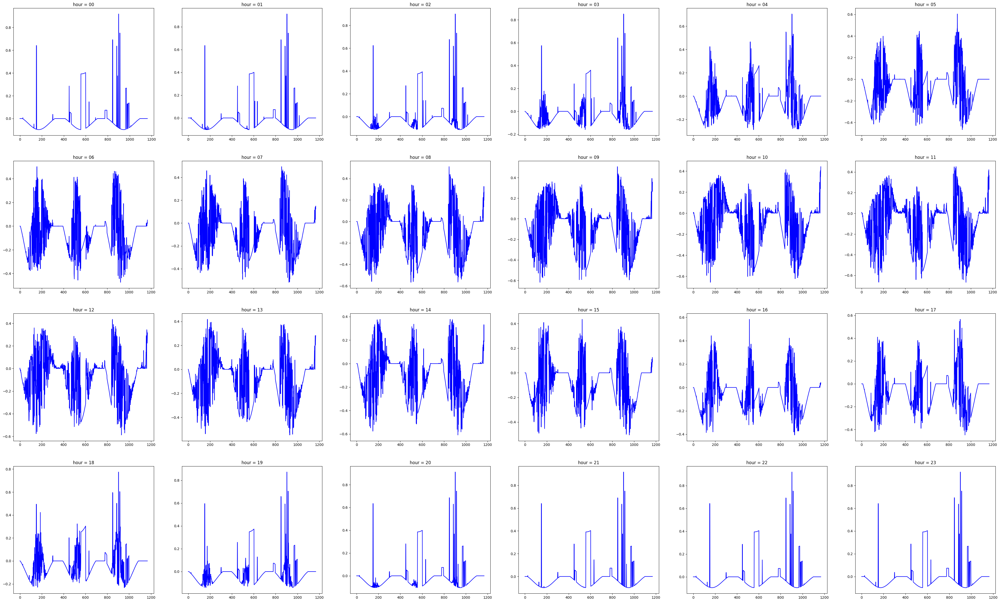

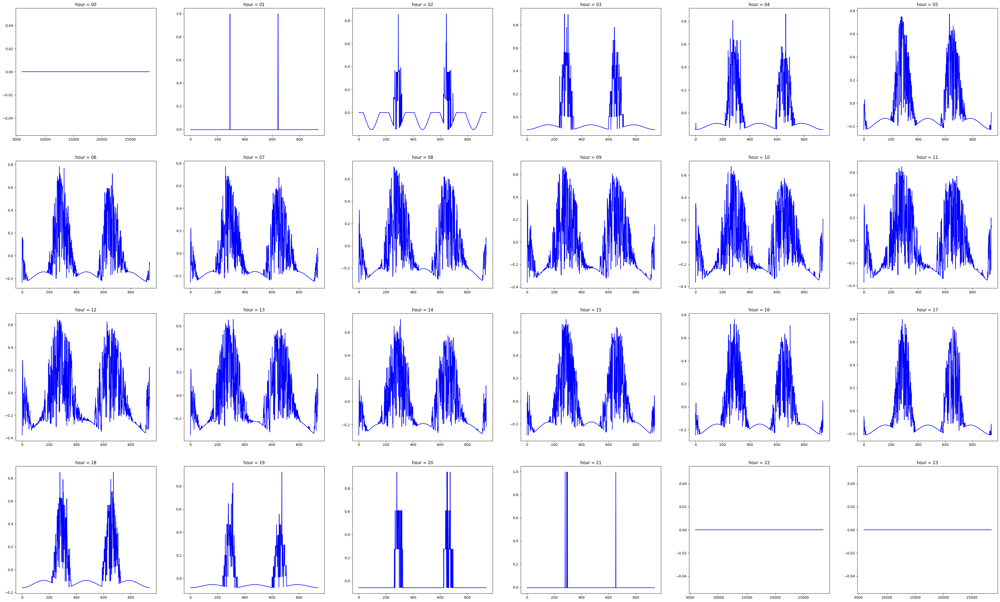

In [22]:
for loc in locations:
    plt.figure(figsize=(50, 30))
    sp_loc = 1
    for h in hours:
        plt.subplot(4, 6, sp_loc)
        plt.plot(y_train[loc][h] - y_pred_train[loc][h], color='b')
        plt.title(f"hour = {h}")
        sp_loc += 1

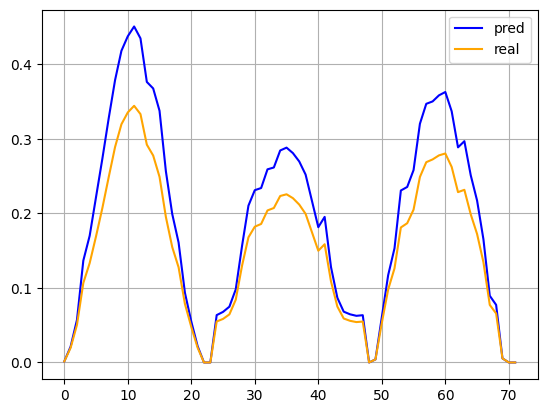

In [23]:
plt.plot(means_pred, c='b', label='pred')
plt.plot(means_train, c='orange', label='real')
plt.legend()
plt.grid()

In [24]:
import pandas as pd

from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics

df = { loc: {} for loc in locations }

for loc in locations:
    for h in hours:
        date_index = [ (start_date[loc] + d).strftime("%Y-%m-%d") for d in [ timedelta(days=k) for k in range(len(y_pred_train[loc][h])) ] ]

        df[loc][h] = pd.DataFrame({'ds': date_index, 'y': y_train[loc][h]})


In [25]:
m = { loc: {} for loc in locations }
forecast = { loc: {} for loc in locations }

for loc in locations:
    for h in hours:
        m[loc][h] = Prophet(changepoint_prior_scale=0.05)
        m[loc][h].fit(df[loc][h])
        future = m[loc][h].make_future_dataframe(periods=66, freq='D')
        forecast[loc][h] = m[loc][h].predict(future)


14:38:25 - cmdstanpy - INFO - Chain [1] start processing
14:38:25 - cmdstanpy - INFO - Chain [1] done processing
14:38:26 - cmdstanpy - INFO - Chain [1] start processing
14:38:26 - cmdstanpy - INFO - Chain [1] done processing
14:38:26 - cmdstanpy - INFO - Chain [1] start processing
14:38:26 - cmdstanpy - INFO - Chain [1] done processing
14:38:26 - cmdstanpy - INFO - Chain [1] start processing
14:38:26 - cmdstanpy - INFO - Chain [1] done processing
14:38:27 - cmdstanpy - INFO - Chain [1] start processing
14:38:27 - cmdstanpy - INFO - Chain [1] done processing
14:38:27 - cmdstanpy - INFO - Chain [1] start processing
14:38:27 - cmdstanpy - INFO - Chain [1] done processing
14:38:27 - cmdstanpy - INFO - Chain [1] start processing
14:38:27 - cmdstanpy - INFO - Chain [1] done processing
14:38:28 - cmdstanpy - INFO - Chain [1] start processing
14:38:28 - cmdstanpy - INFO - Chain [1] done processing
14:38:28 - cmdstanpy - INFO - Chain [1] start processing
14:38:28 - cmdstanpy - INFO - Chain [1]

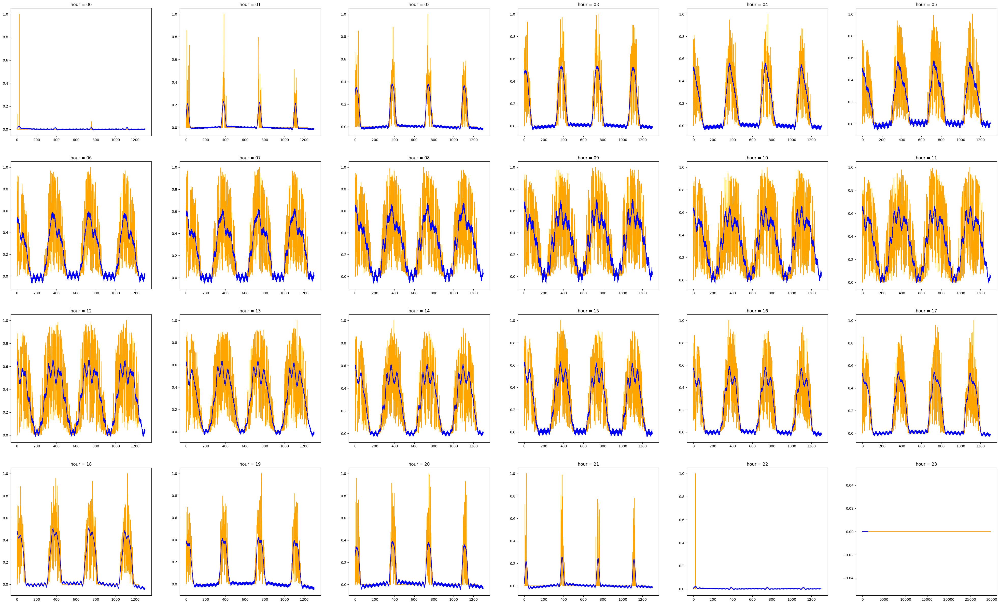

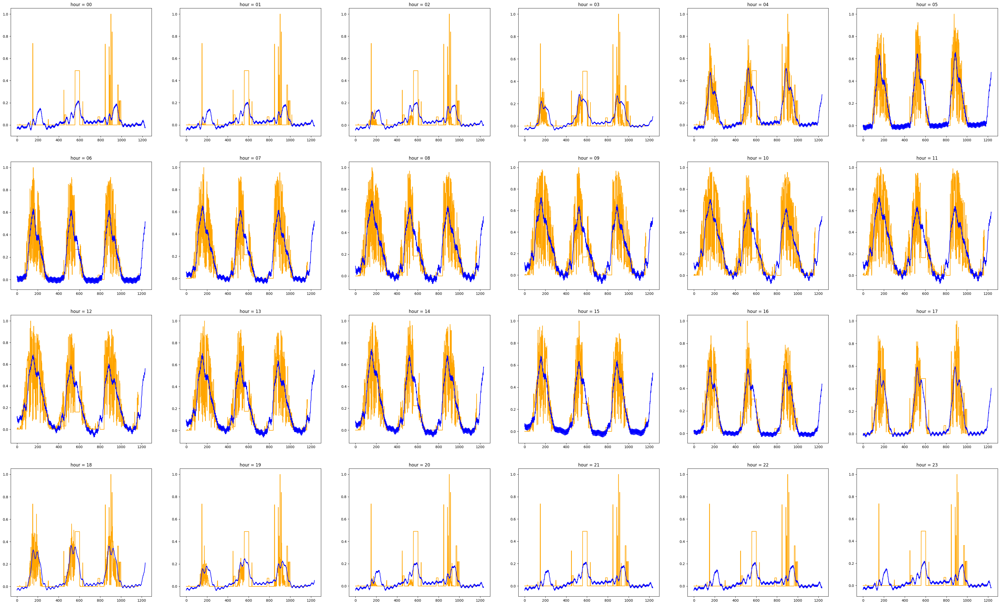

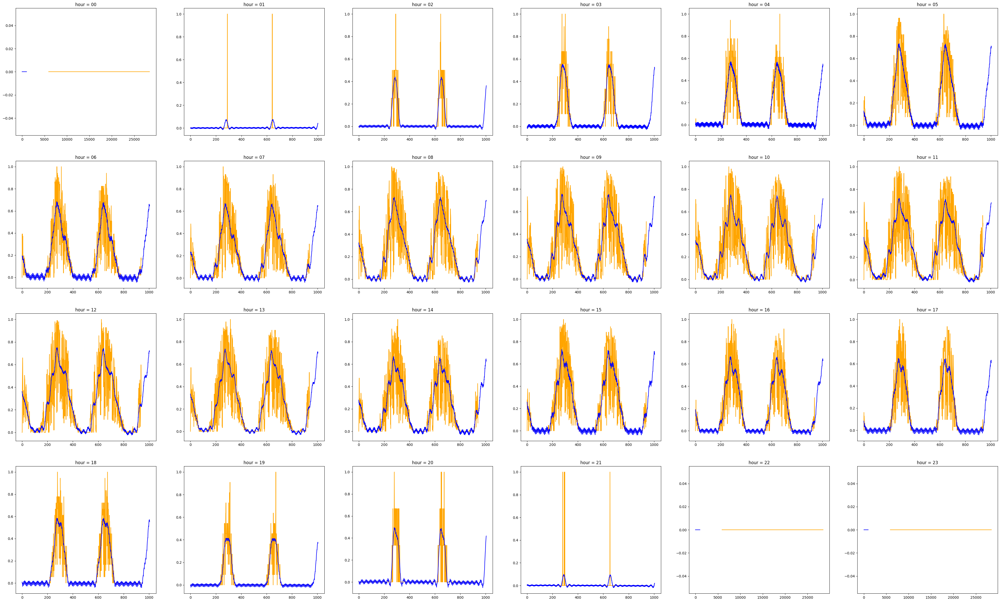

In [26]:
for loc in locations:
    plt.figure(figsize=(50, 30))
    sp_loc = 1
    for h in hours:
        plt.subplot(4, 6, sp_loc)
        plt.plot(y_train[loc][h], color='orange')
        plt.plot(forecast[loc][h]['yhat'], color='b')
        # m[loc][h].plot(forecast[loc][h]) 
        # plt.plot(forecast, color='orange')
        plt.title(f"hour = {h}")
        sp_loc += 1     

In [28]:
df = { loc: {
    h: pd.DataFrame(
        {
            'ds': [(start_date[loc] + d).strftime("%Y-%m-%d") for d in [ timedelta(days=k) for k in range(len(y_pred_train[loc][h]))]], 
            'y': y_train[loc][h] - y_pred_train[loc][h]
        })
        for h in hours
    } for loc in locations }

In [29]:
m = { loc: {} for loc in locations }
forecast = { loc: {} for loc in locations }

for loc in locations:
    for h in hours:
        m[loc][h] = Prophet(changepoint_prior_scale=0.05)
        m[loc][h].fit(df[loc][h])
        future = m[loc][h].make_future_dataframe(periods=66, freq='D')
        forecast[loc][h] = m[loc][h].predict(future)

14:42:21 - cmdstanpy - INFO - Chain [1] start processing
14:42:21 - cmdstanpy - INFO - Chain [1] done processing
14:42:21 - cmdstanpy - INFO - Chain [1] start processing
14:42:21 - cmdstanpy - INFO - Chain [1] done processing
14:42:22 - cmdstanpy - INFO - Chain [1] start processing
14:42:22 - cmdstanpy - INFO - Chain [1] done processing
14:42:22 - cmdstanpy - INFO - Chain [1] start processing
14:42:22 - cmdstanpy - INFO - Chain [1] done processing
14:42:22 - cmdstanpy - INFO - Chain [1] start processing
14:42:23 - cmdstanpy - INFO - Chain [1] done processing
14:42:23 - cmdstanpy - INFO - Chain [1] start processing
14:42:23 - cmdstanpy - INFO - Chain [1] done processing
14:42:23 - cmdstanpy - INFO - Chain [1] start processing
14:42:23 - cmdstanpy - INFO - Chain [1] done processing
14:42:24 - cmdstanpy - INFO - Chain [1] start processing
14:42:24 - cmdstanpy - INFO - Chain [1] done processing
14:42:24 - cmdstanpy - INFO - Chain [1] start processing
14:42:24 - cmdstanpy - INFO - Chain [1]

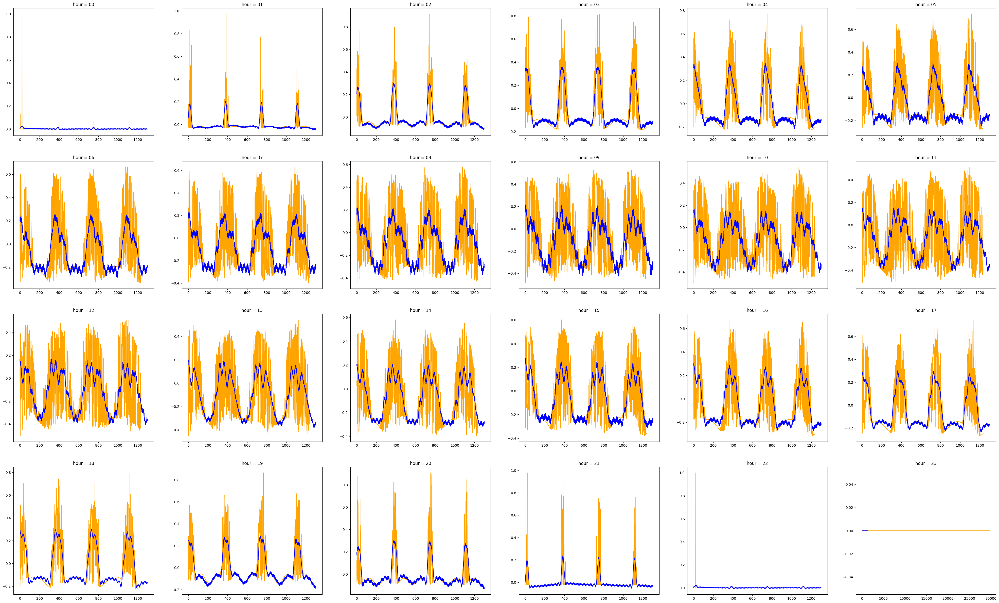

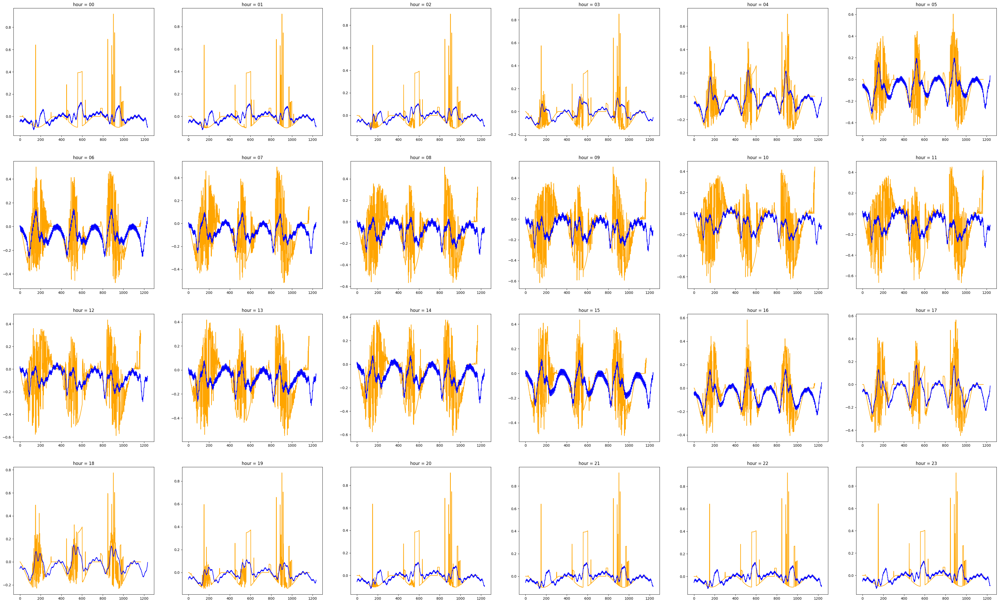

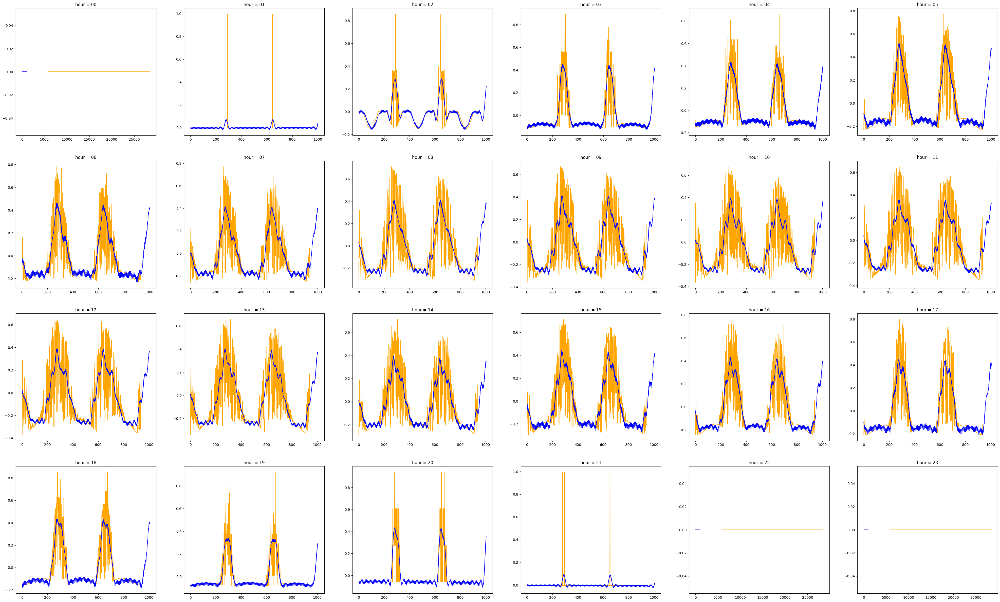

In [30]:
for loc in locations:
    plt.figure(figsize=(50, 30))
    sp_loc = 1
    for h in hours:
        plt.subplot(4, 6, sp_loc)
        plt.plot(y_train[loc][h] - y_pred_train[loc][h], color='orange')
        plt.plot(forecast[loc][h]['yhat'], color='b')
        # m[loc][h].plot(forecast[loc][h]) 
        # plt.plot(forecast, color='orange')
        plt.title(f"hour = {h}")
        sp_loc += 1     

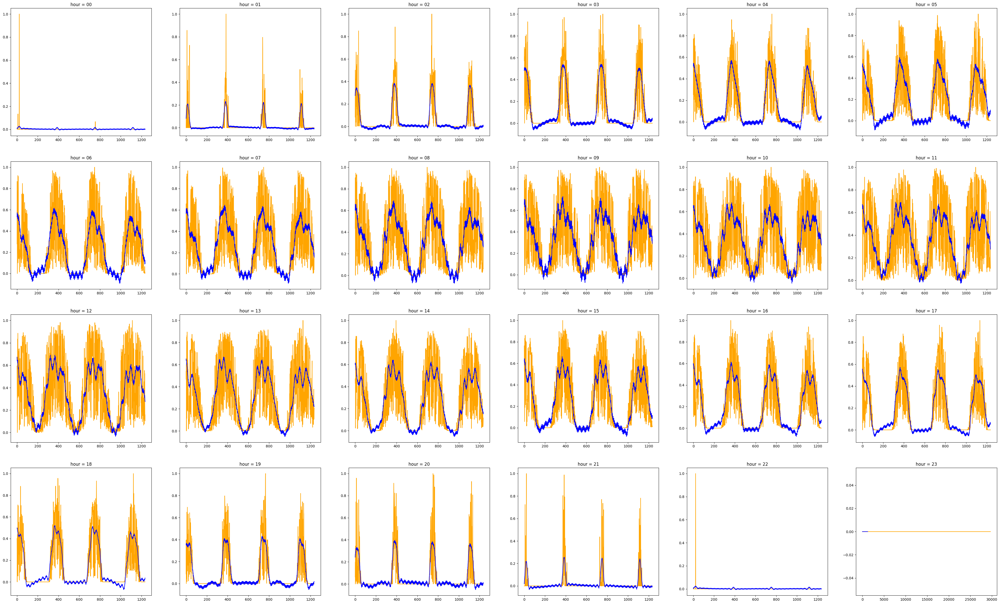

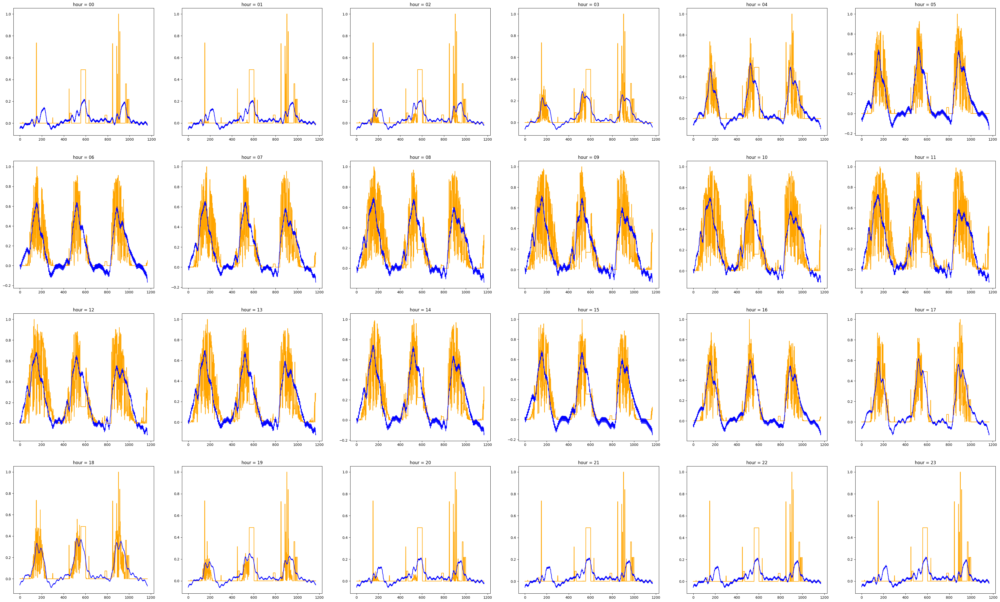

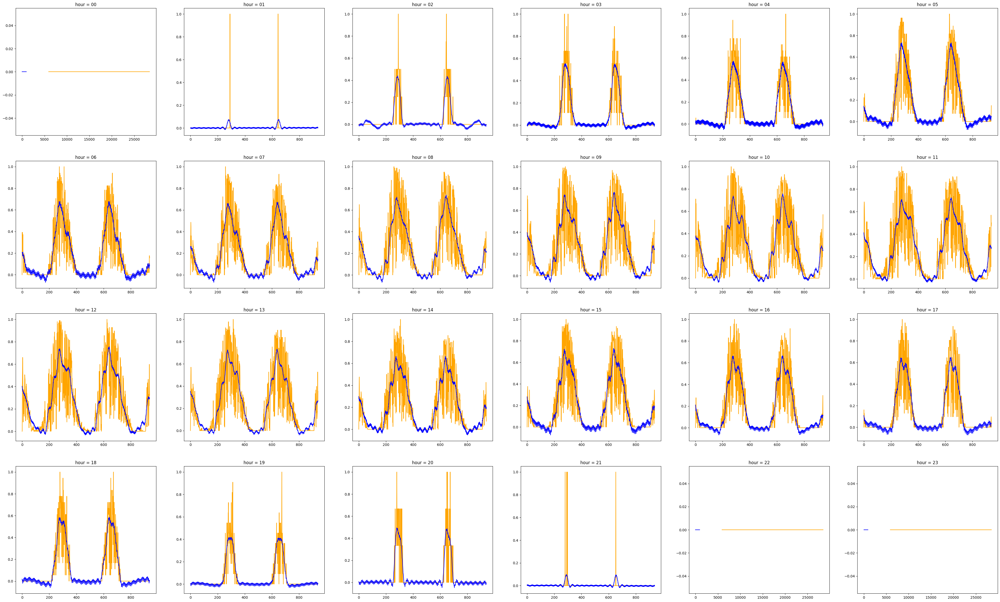

In [32]:
for loc in locations:
    plt.figure(figsize=(50, 30))
    sp_loc = 1
    for h in hours:
        plt.subplot(4, 6, sp_loc)
        plt.plot(y_train[loc][h] , color='orange')
        plt.plot(forecast[loc][h]['yhat'][:len(y_pred_train[loc][h])] + y_pred_train[loc][h], color='b')
        # m[loc][h].plot(forecast[loc][h]) 
        # plt.plot(forecast, color='orange')
        plt.title(f"hour = {h}")
        sp_loc += 1    

In [33]:
2160 / 3

720.0

In [45]:
def normalize_df(df, columns_to_drop=['date_forecast']):
    df_normalized = df.copy()
    df_normalized = df_normalized.drop(columns=columns_to_drop)
    for c in df.columns :
        df_normalized[c] = (df_normalized[c] - df_normalized[c].mean()) / df_normalized[c].std() if df_normalized[c].std() != 0 else (df_normalized[c] - df_normalized[c].mean())

    return df_normalized  

In [46]:
import sys
sys.path.append('../')
import utils
train_a, train_b, train_c, X_train_estimated_a, X_train_estimated_b, X_train_estimated_c, X_train_observed_a, X_train_observed_b, X_train_observed_c, X_test_estimated_a, X_test_estimated_b, X_test_estimated_c = utils.read_files(diff_path='../')


In [47]:
normalize_df(X_train_observed_a)

KeyError: 'date_forecast'